# Introduction to the DataClass

This notebook demonstrates loading and displaying volumes with our custom DataClass, situated in `datatype.py`

In [2]:
%load_ext autoreload
%autoreload 2

In [24]:
import os
from IPython.display import HTML
os.environ["KMP_DUPLICATE_LIB_OK"] = "TRUE"


In [4]:
import sys
import pathlib

PROJECT_ROOT = pathlib.Path().cwd().parent
sys.path.append(str(PROJECT_ROOT))


from src.utils import *
from src.datatype import MRIDataset

image_path = PROJECT_ROOT / 'ReMIND2Reg_dataset' / 'imagesTr'

c:\Users\noe\anaconda3\envs\torchIO\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [5]:
patient_id = "005" # between 000 and 102, t1 and t2 don't exist for all patients
iUS_file = f"ReMIND2Reg_0{patient_id}_0000.nii.gz"
t1_file = f"ReMIND2Reg_0{patient_id}_0001.nii.gz"
t2_file = f"ReMIND2Reg_0{patient_id}_0002.nii.gz"


## 2D Visualisation of MRI

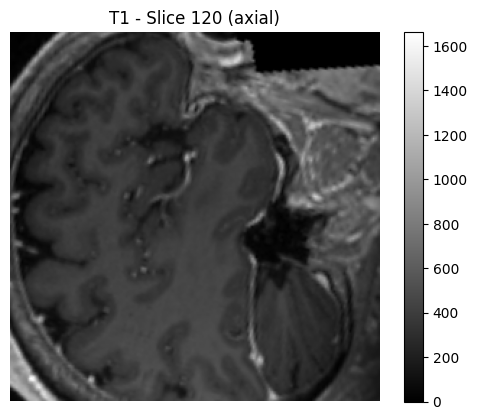

In [39]:
MRI_data = MRIDataset([image_path / t1_file], "T1", axis=0)
MRI_data.plot2D(0,120);

## 3D Viualization of the MRI image

This takes a while to load.

In [7]:
MRI_data.plot3D()

## 2D Vizualization of the US image

In [ ]:
from src.datatype import iUSDataset
US_data = iUSDataset(image_path / iUS_file, "T1", axis=0)

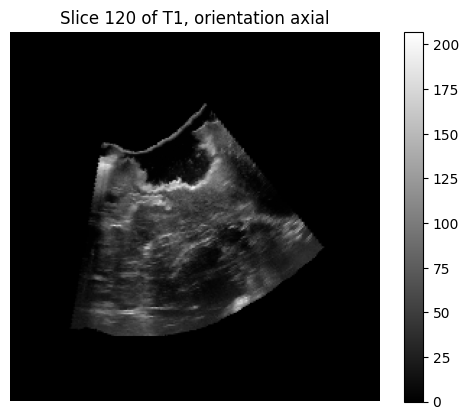

In [11]:
US_data.plot2D(slice_id=120, axis=0)

In [20]:
torch.min(US_data[100].squeeze())

tensor(0.)

# Display as Videos

In [ ]:
For ultrasound and MRI, we can display 

In [32]:
ani = render_video_frame([US_data[i].squeeze() for i in range(100,140)])
HTML(ani.to_jshtml())

In [38]:
ani = render_video_frame([MRI_data[0]['image'][:,:,i].squeeze() for i in range(50,150)])
HTML(ani.to_jshtml())